In [1569]:
plot_heatmap(X_distance_Bt[:, :, 0], colorscale='blues')

In [362]:
p_H = 2
PD = PairwiseDistance(
    metric='heat', metric_params={'p': p_H, 'n_bins': 100, 'sigma': 0.1}, order=None)

X_distance_H = PD.fit_transform(persistence_diagrams)

In [1571]:
plot_heatmap(X_distance_H[:, :, 0], colorscale='blues')

In [363]:
p_S = 2
PD = PairwiseDistance(
    metric='silhouette', metric_params={'p': p_H, 'n_bins': 100, 'power': 1}, order=None)

X_distance_S = PD.fit_transform(persistence_diagrams)

In [1576]:
plot_heatmap(X_distance_S[:, :, 0], colorscale='blues')

Text(652.0000000000001, 0.5, 'Patient$_{j}$')

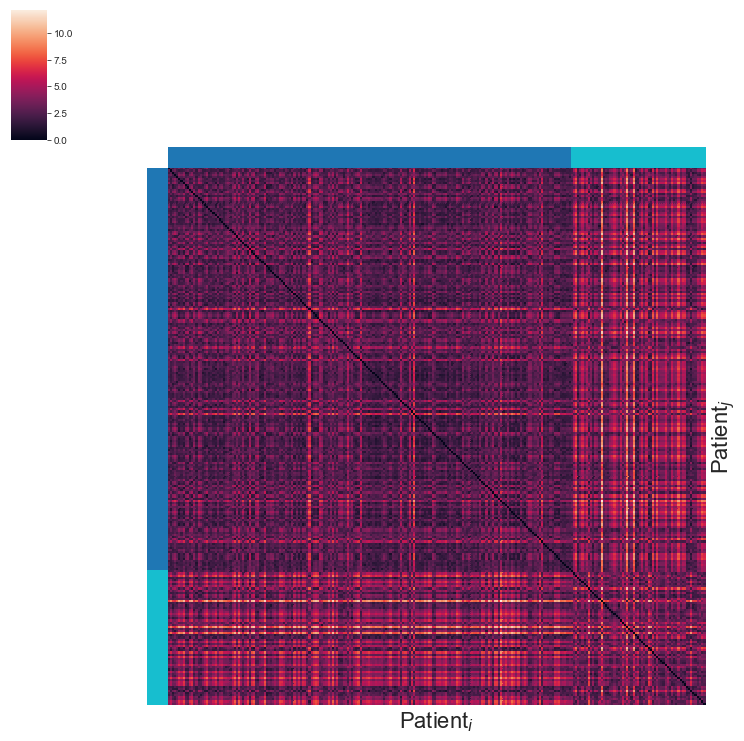

In [1824]:
cg = sns.clustermap(X_distance_Bt[:, :, 0], row_colors=plt.cm.tab10(labels), 
               col_colors=plt.cm.tab10(labels), 
               row_cluster=False, col_cluster=False,
               xticklabels=[], yticklabels=[])
cg.ax_heatmap.set_xlabel(r'Patient$_{i}$', fontsize=22)
cg.ax_heatmap.set_ylabel(r'Patient$_{j}$', fontsize=22, rotation=90)

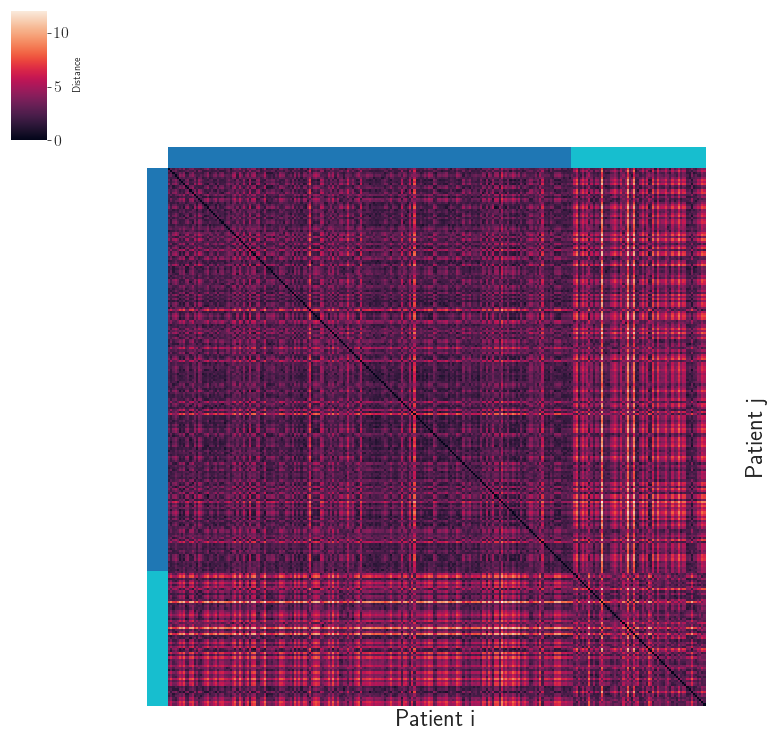

In [459]:
distance_matrix = X_distance_Bt[:, :, 0]
patient_labels = labels

distance_clustermap = sns.clustermap(distance_matrix, 
                                     row_colors=plt.cm.tab10(patient_labels), 
                                     col_colors=plt.cm.tab10(patient_labels), 
                                     row_cluster=False, col_cluster=False,
                                     xticklabels=[], yticklabels=[], 
                                     #cbar_pos=(0.15, 0.05, 0.05, 0.18), 
                                     cbar_kws={'label': 'Distance'})

distance_clustermap.ax_heatmap.set_xlabel('Patient i', fontsize=24)
distance_clustermap.ax_heatmap.set_ylabel('Patient j', fontsize=24, rotation=90, labelpad=40)

distance_clustermap.cax.tick_params(labelsize=16)

plt.savefig("Bt_distance_clustermap.png", dpi=300, bbox_inches='tight')
plt.show()

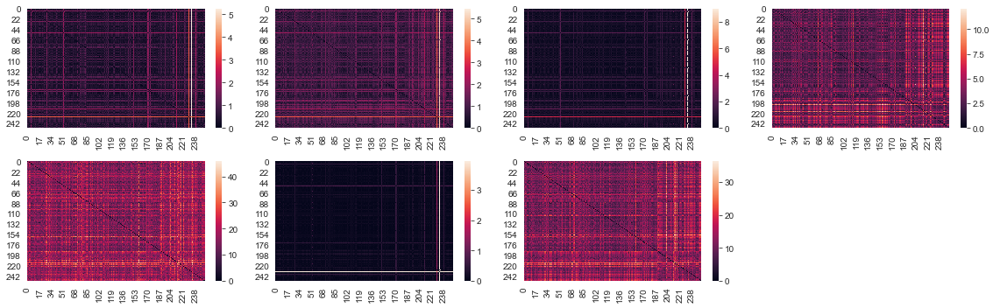

In [1714]:
#"bottleneck", "wasserstein", "landscape", "betti", "heat", "silhouette","persistence_image"
ax = tuple(['ax'+str(x) for x in range(7)])
    
fig, ax = plt.subplots(2,4, figsize=(16, 5))

mylist = [X_distance_B[:, :, 0], X_distance_W[:, :, 0], X_distance_L[:, :, 0],X_distance_Bt[:, :, 0],X_distance_H[:, :, 0],
             X_distance_S[:, :, 0],X_distance_PI[:, :, 0]]

for i in range(7):
    sns.heatmap(mylist[i], ax=ax.flatten()[i])
        #plt.title("PI of $H_1$ for Y1 survivor" + str(i))
        
plt.axis('off')     
plt.tight_layout()
#plt.show()
plt.savefig('TF_pat_distance_heatmaps.pdf', dpi=300, bbox_inches='tight')

In [1595]:
type(X_distance_PI[:, :, 0])
mylist = [X_distance_B, X_distance_W, X_distance_L,X_distance_Bt,X_distance_H,
            X_distance_S,X_distance_PI]
mylist

[array([[[0.        , 0.        , 0.        ],
         [0.46399204, 0.3064993 , 0.        ],
         [0.40212643, 0.31299645, 0.        ],
         ...,
         [0.98984969, 0.28884797, 0.        ],
         [0.55679045, 0.32340199, 0.01504594],
         [0.30932803, 0.33254974, 0.        ]],
 
        [[0.45325129, 0.3064993 , 0.        ],
         [0.        , 0.        , 0.        ],
         [0.3101193 , 0.26878506, 0.        ],
         ...,
         [0.52481728, 0.0594687 , 0.        ],
         [0.42939595, 0.3094849 , 0.01504594],
         [0.52481728, 0.09868623, 0.        ]],
 
        [[0.39598206, 0.31299645, 0.        ],
         [0.29466295, 0.26878506, 0.        ],
         [0.        , 0.        , 0.        ],
         ...,
         [0.58672358, 0.27185691, 0.        ],
         [0.34469364, 0.29014209, 0.01504594],
         [0.44004268, 0.27712478, 0.        ]],
 
        ...,
 
        [[1.00210773, 0.29930464, 0.        ],
         [0.52578624, 0.06045498, 0.     

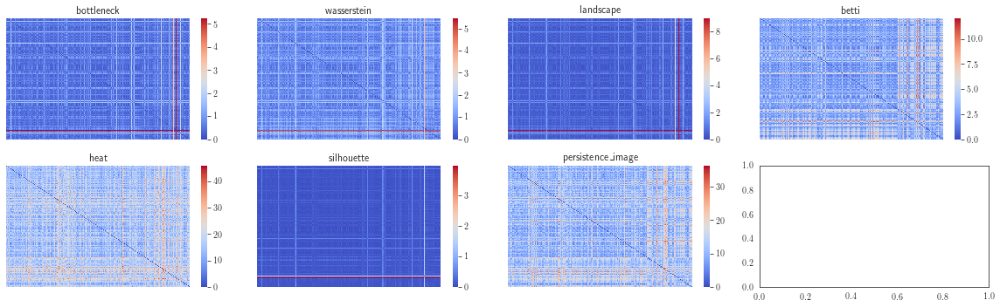

In [398]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define subplots
fig, ax = plt.subplots(2, 4, figsize=(16, 5))

# Define data list
data_list = [
    X_distance_B[:, :, 0], 
    X_distance_W[:, :, 0], 
    X_distance_L[:, :, 0],
    X_distance_Bt[:, :, 0],
    X_distance_H[:, :, 0],
    X_distance_S[:, :, 0],
    X_distance_PI[:, :, 0]
]

# Plot heatmaps
for i in range(7):
    sns.heatmap(data_list[i], ax=ax.flatten()[i], cmap='coolwarm')
    ax[i // 4, i % 4].set_xticklabels([])
    ax[i // 4, i % 4].set_yticklabels([])
    ax[i // 4, i % 4].set_title(['bottleneck', 'wasserstein', 'landscape', 'betti', 'heat', 'silhouette','persistence_image'][i])
    ax[i // 4, i % 4].set_xlabel('')
    ax[i // 4, i % 4].set_ylabel('')

# Save plot
plt.tight_layout()
plt.savefig('TF_pat_distance_heatmaps_2.pdf', dpi=300, bbox_inches='tight')

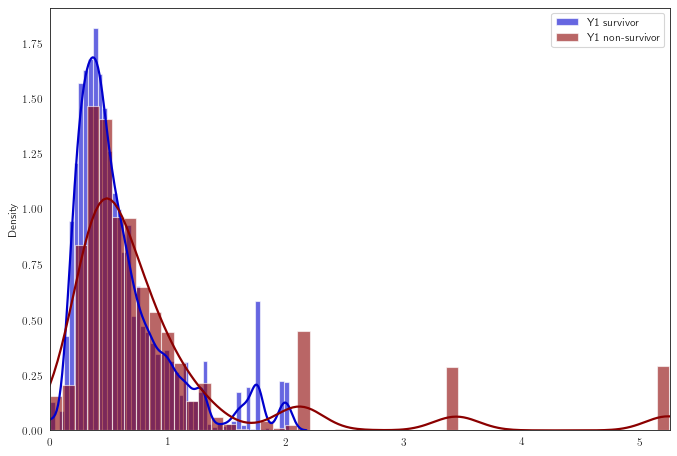

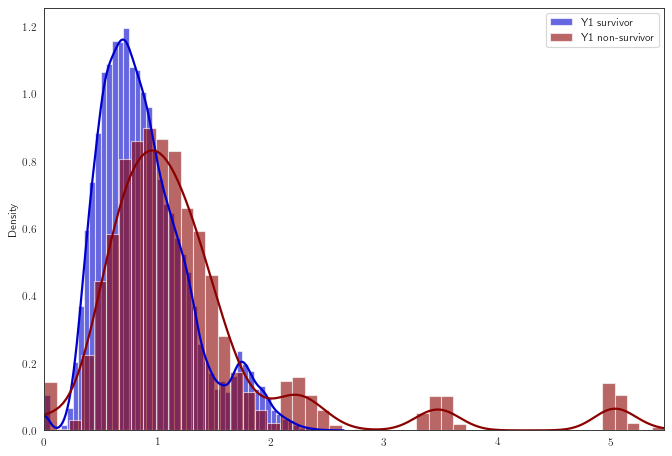

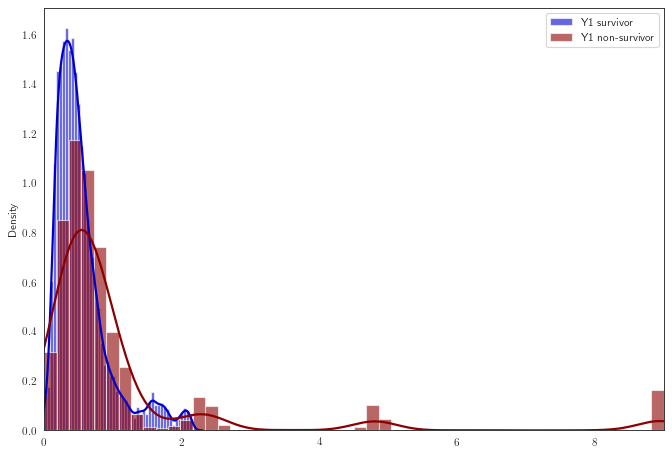

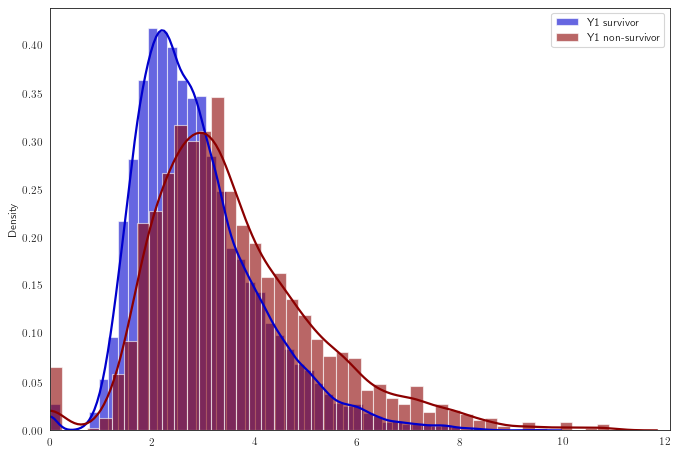

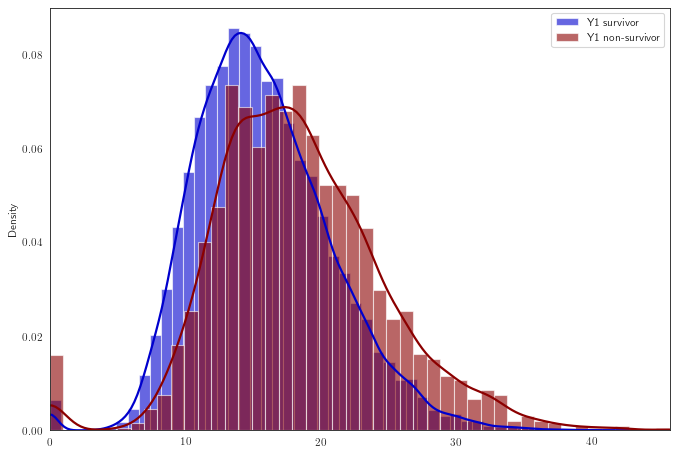

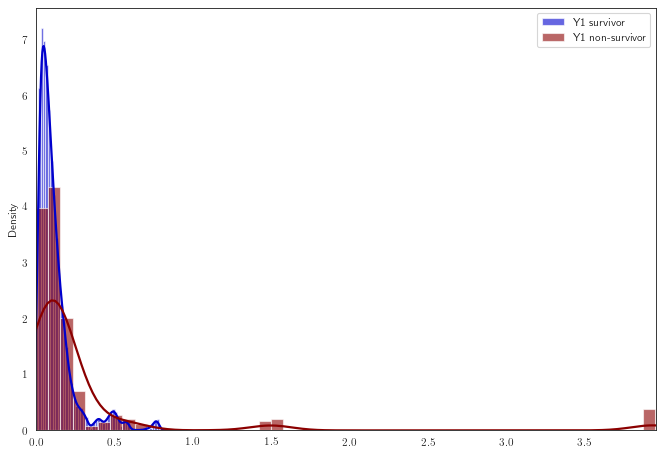

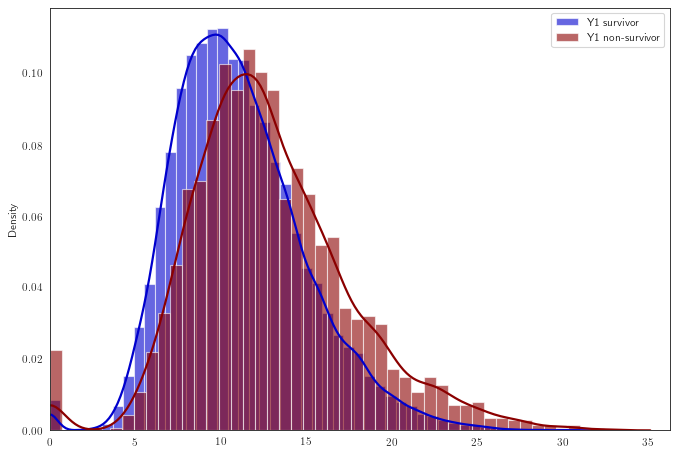

In [500]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_distance_histogram(X_distance, filename):
    # Set style
    sns.set_style("white")
    
    # Set color palette
    #cool_palette = sns.color_palette("coolwarm", 2)
    cool_palette = ["mediumblue", "darkred"]
    # Plot parameters
    kwargs = dict(hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
    fig, ax = plt.subplots(figsize=(10,7), dpi=80)
    
    # Plot histograms
    sns.distplot(X_distance[:189,:189,0], color=cool_palette[0], label="Y1 survivor", **kwargs)
    sns.distplot(X_distance[189:,189:,0], color=cool_palette[1], label="Y1 non-survivor", **kwargs)
    
    # Set axis limits and legend
    ax.set_xlim(X_distance.min(), X_distance.max())
    ax.legend()
    
    # Save figure
    plt.savefig(filename, dpi=300, bbox_inches='tight')

    
# List of input arrays
inputs = [X_distance_B, X_distance_W, X_distance_L, X_distance_Bt, X_distance_H, X_distance_S, X_distance_PI]

# Iterate over inputs and plot distance histogram for each
for i, X_distance in enumerate(inputs):
    # Set filename based on input index
    filename = f"distance_hist_density_batch_{i+1}.pdf"
    
    # Call plot_distance_histogram function
    plot_distance_histogram(X_distance, filename)


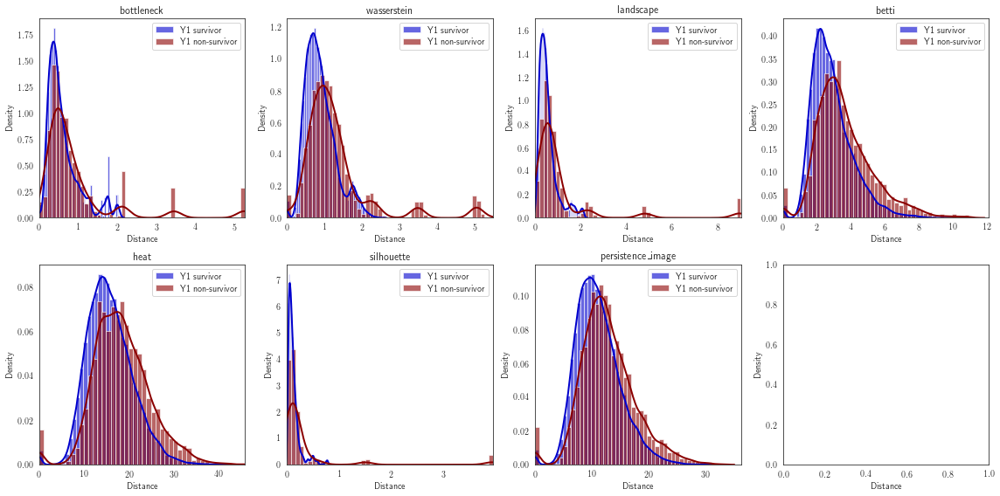

In [399]:
# Set style and color palette
sns.set_style("white")
cool_palette = ["mediumblue", "darkred"]

# Create figure with subplots arranged in a 2x4 grid
fig, ax = plt.subplots(2, 4, figsize=(16, 8))

# Flatten the axis array for easier iteration
ax_flat = ax.flatten()

# Iterate over inputs and plot distance histogram for each
for i, X_distance in enumerate(inputs):
    # Plot histogram on corresponding axis
    sns.distplot(X_distance[:189, :189, 0], color=cool_palette[0], label="Y1 survivor", ax=ax_flat[i], hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
    sns.distplot(X_distance[189:, 189:, 0], color=cool_palette[1], label="Y1 non-survivor", ax=ax_flat[i], hist_kws={'alpha':.6}, kde_kws={'linewidth':2})

    # Set axis limits and legend
    ax_flat[i].set_xlim(X_distance.min(), X_distance.max())
    ax_flat[i].legend()

    # Set plot title
    plot_titles = ["bottleneck", "wasserstein", "landscape", "betti", "heat", "silhouette", "persistence_image"]
    ax_flat[i].set_title(plot_titles[i])

# Set axis labels and tighten layout
for i in range(2):
    for j in range(4):
        ax[i, j].set_xlabel("Distance")
        ax[i, j].set_ylabel("Density")
fig.tight_layout()

# Save figure
plt.savefig("distance_hist_density_2.pdf", dpi=300, bbox_inches='tight')

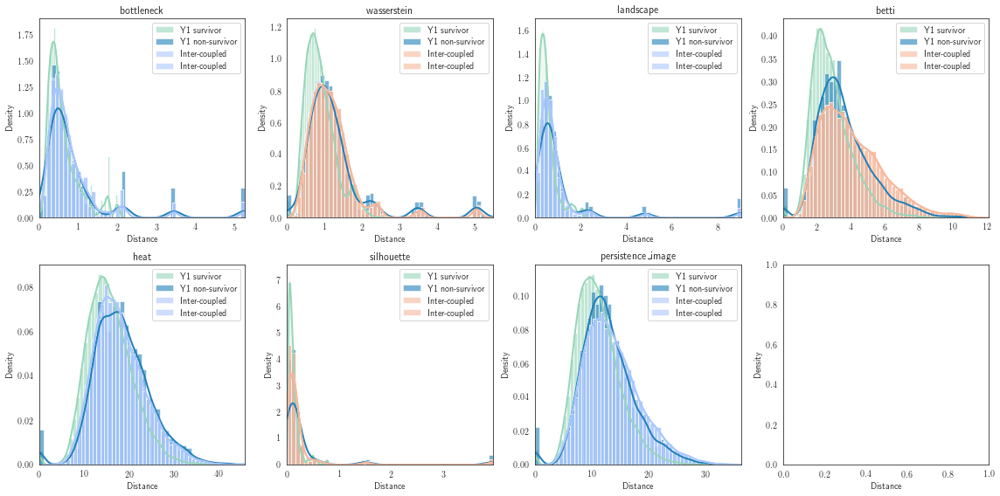

In [414]:
import seaborn as sns
import matplotlib.pyplot as plt

# Define color palettes
intra_palette = sns.color_palette("YlGnBu", n_colors=2)
inter_palette = sns.color_palette("coolwarm", n_colors=2)

# Create figure with subplots arranged in a 2x4 grid
fig, ax = plt.subplots(2, 4, figsize=(16, 8))

# Flatten the axis array for easier iteration
ax_flat = ax.flatten()

# Iterate over inputs and plot distance histogram for each
for i, X_distance in enumerate(inputs):
    # Define color for inter-coupled distributions
    inter_color = inter_palette[i % 2]

    # Plot histogram on corresponding axis
    sns.distplot(X_distance[:189, :189, 0], color=intra_palette[0], label="Y1 survivor", ax=ax_flat[i], hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
    sns.distplot(X_distance[189:, 189:, 0], color=intra_palette[1], label="Y1 non-survivor", ax=ax_flat[i], hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
    sns.distplot(X_distance[:189, 189:, 0], color=inter_color, label="Inter-coupled", ax=ax_flat[i], hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
    sns.distplot(X_distance[189:, :189, 0], color=inter_color, label="Inter-coupled", ax=ax_flat[i], hist_kws={'alpha':.6}, kde_kws={'linewidth':2})

    # Set axis limits and legend
    ax_flat[i].set_xlim(X_distance.min(), X_distance.max())
    ax_flat[i].legend()

    # Set plot title
    plot_titles = ["bottleneck", "wasserstein", "landscape", "betti", "heat", "silhouette", "persistence_image"]
    ax_flat[i].set_title(plot_titles[i])

# Set axis labels and tighten layout
for i in range(2):
    for j in range(4):
        ax[i, j].set_xlabel("Distance")
        ax[i, j].set_ylabel("Density")
fig.tight_layout()

# Save figure
plt.savefig("distance_hist_density_3.pdf", dpi=300, bbox_inches='tight')


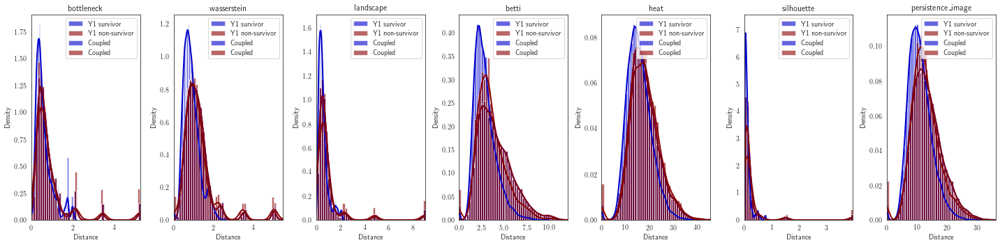

In [415]:
# Set style and color palette
sns.set_style("white")
cool_palette = ["mediumblue", "darkred"]

# Create figure with subplots arranged in a 1x7 grid
fig, ax = plt.subplots(1, 7, figsize=(20, 5))

# Iterate over inputs and plot distance histogram for each
for i, X_distance in enumerate(inputs):
    # Plot histogram on corresponding axis
    sns.distplot(X_distance[:189, :189, 0], color=cool_palette[0], label="Y1 survivor", ax=ax[i], hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
    sns.distplot(X_distance[189:, 189:, 0], color=cool_palette[1], label="Y1 non-survivor", ax=ax[i], hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
    sns.distplot(X_distance[:189, 189:, 0], color=cool_palette[0], label="Coupled", ax=ax[i], hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
    sns.distplot(X_distance[189:, :189, 0], color=cool_palette[1], label="Coupled", ax=ax[i], hist_kws={'alpha':.6}, kde_kws={'linewidth':2})

    # Set axis limits and legend
    ax[i].set_xlim(X_distance.min(), X_distance.max())
    ax[i].legend()

    # Set plot title
    plot_titles = ["bottleneck", "wasserstein", "landscape", "betti", "heat", "silhouette", "persistence_image"]
    ax[i].set_title(plot_titles[i])

# Set axis labels and tighten layout
for i in range(7):
    ax[i].set_xlabel("Distance")
    ax[i].set_ylabel("Density")
fig.tight_layout()

# Save figure
plt.savefig("distance_hist_density_3_all_in_one.pdf", dpi=300, bbox_inches='tight')


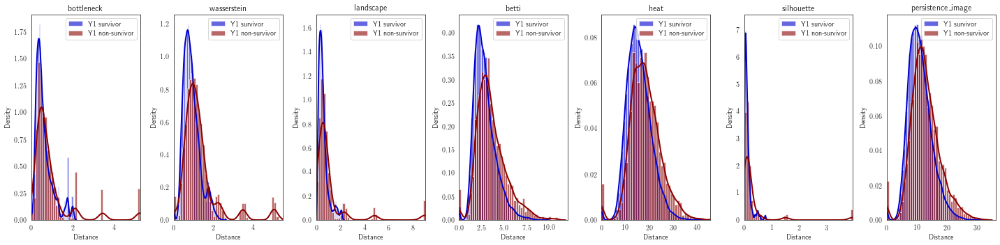

In [419]:
# Set style and color palette
sns.set_style("white")
cool_palette = ["mediumblue", "darkred"]

# Create figure with subplots arranged in a 1x7 grid
fig, ax = plt.subplots(1, 7, figsize=(20, 5))

# Iterate over inputs and plot distance histogram for each
for i, X_distance in enumerate(inputs):
    # Plot histogram on corresponding axis
    sns.distplot(X_distance[:189, :189, 0], color=cool_palette[0], label="Y1 survivor", ax=ax[i], hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
    sns.distplot(X_distance[189:, 189:, 0], color=cool_palette[1], label="Y1 non-survivor", ax=ax[i], hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
    #sns.distplot(X_distance[:189, 189:, 0], color=cool_palette[0], label="Coupled", ax=ax[i], hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
    #sns.distplot(X_distance[189:, :189, 0], color=cool_palette[1], label="Coupled", ax=ax[i], hist_kws={'alpha':.6}, kde_kws={'linewidth':2})

    # Set axis limits and legend
    ax[i].set_xlim(X_distance.min(), X_distance.max())
    ax[i].legend()

    # Set plot title
    plot_titles = ["bottleneck", "wasserstein", "landscape", "betti", "heat", "silhouette", "persistence_image"]
    ax[i].set_title(plot_titles[i])

# Set axis labels and tighten layout
for i in range(7):
    ax[i].set_xlabel("Distance")
    ax[i].set_ylabel("Density")
fig.tight_layout()

# Save figure
plt.savefig("distance_hist_density_3_all_in_one_non_intercoupled.pdf", dpi=300, bbox_inches='tight')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


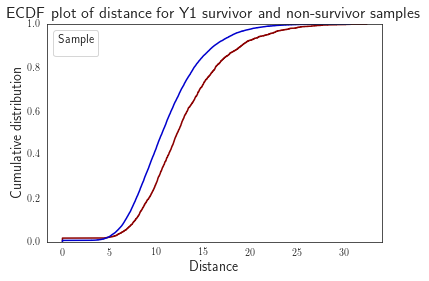

In [492]:
# Adjust the size of the second array to match the size of the first array
X_distance_adjusted = X_distance[189:, 189:, 0][:, :189]

# Flatten the 2-dimensional distance array
distance_flat = X_distance_adjusted.flatten()

# Create a DataFrame with the data to plot
df = pd.DataFrame({
    'Distance': np.concatenate([X_distance[:189, :189, 0].flatten(), X_distance_adjusted.flatten()]),
    'Sample': ['Y1 survivor'] * 189*189 + ['Y1 non-survivor'] * 63*63
})

# Create the ecdfplot
sns.ecdfplot(data=df, x='Distance', hue='Sample', palette=['mediumblue', 'darkred'], legend=False)

# Adjust the legend properties
plt.legend(title='Sample', loc='upper left', fontsize=12, title_fontsize=12)

# Add axis labels and title
plt.xlabel('Distance', fontsize=14)
plt.ylabel('Cumulative distribution', fontsize=14)
plt.title('ECDF plot of distance for Y1 survivor and non-survivor samples', fontsize=16)

# Save the figure
plt.savefig('ecdfplot_distance_survivor_vs_non-survivor.png', dpi=300, bbox_inches='tight')

In [468]:
df

,Sample,Value
0,Y1 survivor,0.000000
1,Y1 survivor,12.767939
2,Y1 survivor,9.616483
3,Y1 survivor,12.298891
4,Y1 survivor,11.029709
...,...,...
39685,Y1 non-survivor,16.022215
39686,Y1 non-survivor,12.659514
39687,Y1 non-survivor,10.134585
39688,Y1 non-survivor,12.270905


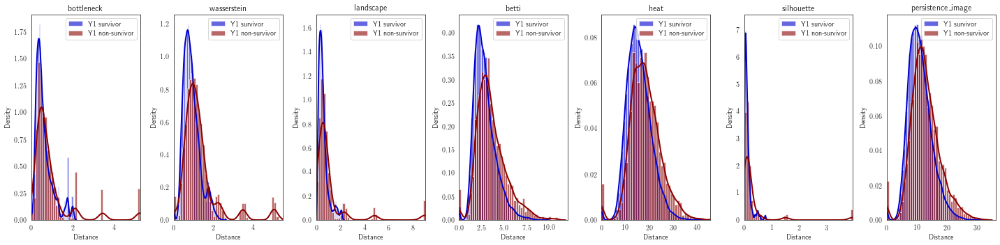

In [493]:
# Set style and color palette
sns.set_style("white")
cool_palette = ["mediumblue", "darkred"]

# Create figure with subplots arranged in a 1x7 grid
fig, ax = plt.subplots(1, 7, figsize=(20, 5))

# Iterate over inputs and plot distance histogram for each
for i, X_distance in enumerate(inputs):
    # Plot histogram on corresponding axis
    sns.distplot(X_distance[:189, :189, 0], color=cool_palette[0], label="Y1 survivor", ax=ax[i], hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
    sns.distplot(X_distance[189:, 189:, 0], color=cool_palette[1], label="Y1 non-survivor", ax=ax[i], hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
    #sns.distplot(X_distance[:189, 189:, 0], color=cool_palette[0], label="Coupled", ax=ax[i], hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
    #sns.distplot(X_distance[189:, :189, 0], color=cool_palette[1], label="Coupled", ax=ax[i], hist_kws={'alpha':.6}, kde_kws={'linewidth':2})

    # Set axis limits and legend
    ax[i].set_xlim(X_distance.min(), X_distance.max())
    ax[i].legend()

    # Set plot title
    plot_titles = ["bottleneck", "wasserstein", "landscape", "betti", "heat", "silhouette", "persistence_image"]
    ax[i].set_title(plot_titles[i])

# Set axis labels and tighten layout
for i in range(7):
    ax[i].set_xlabel("Distance")
    ax[i].set_ylabel("Density")
fig.tight_layout()

# Save figure
plt.savefig("distance_hist_density_3_all_in_one_non_intercoupled.pdf", dpi=300, bbox_inches='tight')

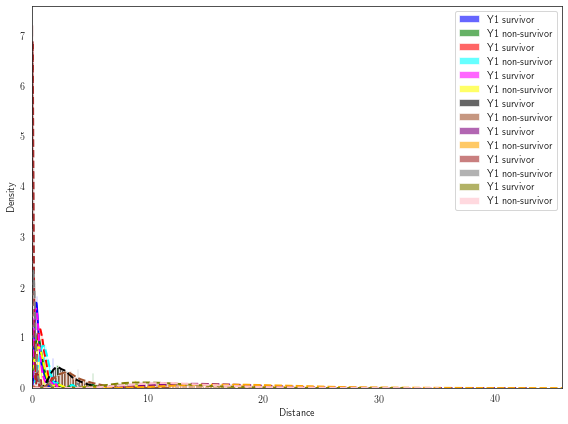

In [433]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set style and color palette
sns.set_style("white")
cool_palette = ['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'sienna', 'purple', 'orange', 'brown', 'gray', 'olive', 'pink']


# Create figure with a single subplot
fig, ax = plt.subplots(1, 1, figsize=(8, 6))

# Iterate over inputs and plot distance histogram for each
for i, X_distance in enumerate(inputs):
    # Plot histogram for the first group (survivors)
    sns.distplot(X_distance[:189, :189, 0], color=cool_palette[i*2], label="Y1 survivor", ax=ax, hist_kws={'alpha':.6}, kde_kws={'linewidth':2, 'linestyle':'-' if i == 0 else '--'})

    # Plot histogram for the second group (non-survivors)
    sns.distplot(X_distance[189:, 189:, 0], color=cool_palette[i*2+1], label="Y1 non-survivor", ax=ax, hist_kws={'alpha':.6}, kde_kws={'linewidth':2, 'linestyle':'-' if i == 0 else '--'})

ax.set_xlim(min([X_distance.min() for X_distance in inputs]), max([X_distance.max() for X_distance in inputs]))
ax.legend()

# Set axis labels and tighten layout
ax.set_xlabel("Distance")
ax.set_ylabel("Density")
fig.tight_layout()

# Save figure
plt.savefig("distance_hist_density_3_single_panel.pdf", dpi=300, bbox_inches='tight')

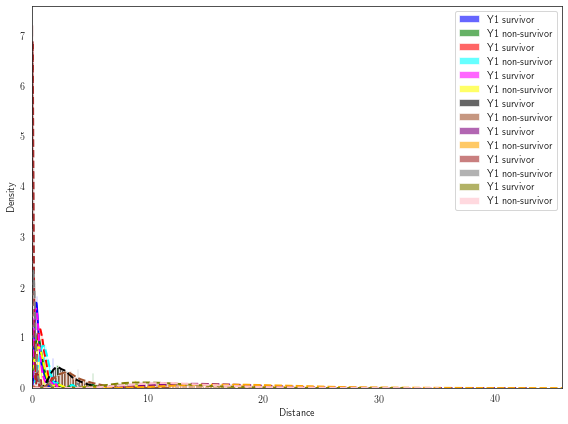

In [455]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set style and color palette
sns.set_style("white")
cool_palette = ['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'sienna', 'purple', 'orange', 'brown', 'gray', 'olive', 'pink', 'teal', 'navy', 'maroon', 'salmon', 'gold', 'turquoise']

# Create figure with a single subplot
fig, ax = plt.subplots(1, 1, figsize=(8, 6))

# Example inputs
#inputs = [X_distance_1, X_distance_2, X_distance_3]

# Iterate over inputs and plot distance histogram for each
for i, X_distance in enumerate(inputs):
    # Plot histogram for the first group (survivors)
    survivor_color = cool_palette[i*2]
    survivor_linestyle = '-' if i == 0 else '--'
    sns.distplot(X_distance[:189, :189, 0], color=survivor_color, label="Y1 survivor", ax=ax, hist_kws={'alpha':.6}, kde_kws={'linewidth':2, 'linestyle':survivor_linestyle, "kernel": "tri"})

    # Plot histogram for the second group (non-survivors)
    non_survivor_color = cool_palette[i*2+1]
    non_survivor_linestyle = '-' if i == 0 else '--'
    sns.distplot(X_distance[189:, 189:, 0], color=non_survivor_color, label="Y1 non-survivor", ax=ax, hist_kws={'alpha':.6}, kde_kws={'linewidth':2, 'linestyle':non_survivor_linestyle, "kernel": "tri"})

ax.set_xlim(min([X_distance.min() for X_distance in inputs]), max([X_distance.max() for X_distance in inputs]))
ax.legend()

# Set axis labels and tighten layout
ax.set_xlabel("Distance")
ax.set_ylabel("Density")
fig.tight_layout()

# Save figure
plt.savefig("distance_hist_density_3_single_panel_2.pdf", dpi=300, bbox_inches='tight')



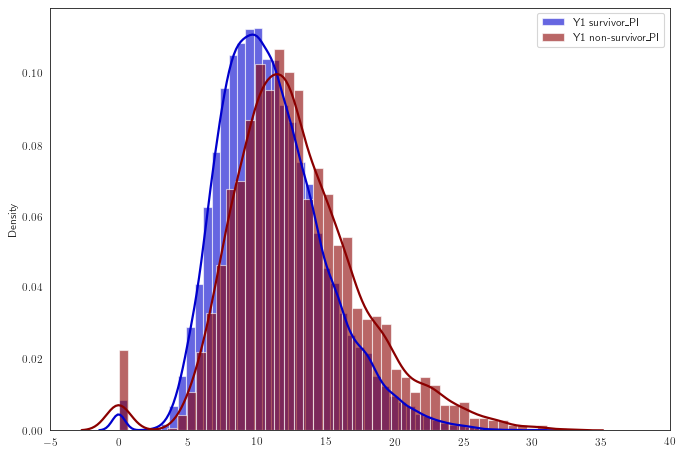

In [375]:
import seaborn as sns
sns.set_style("white")
# Plot
kwargs = dict(hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
plt.figure(figsize=(10,7), dpi= 80)
#ax1.hist(X_distance_PI[:189,:189,0], density = True, bins = 50)
#ax2.hist(X_distance_PI[189:,189:,0], density = True, bins = 50)
sns.distplot(X_distance_PI[:189,:189,0], color="mediumblue", label="Y1 survivor_PI", **kwargs)
sns.distplot(X_distance_PI[189:,189:,0], color="darkred", label="Y1 non-survivor_PI", **kwargs)
#sns.distplot(X_distance_Bt[:189,:189], color="deeppink", label="Y1 survivor_Bt", **kwargs)
#sns.distplot(X_distance_Bt[189:,189:], color="green", label="Y1 non-survivor_Bt", **kwargs)

plt.xlim(-5,40)
#plt.ylim(0,1)
plt.legend();
plt.savefig('PI_pat_distance_hist_density_2.pdf', dpi=300, bbox_inches='tight')

In [494]:
from sklearn.metrics.pairwise import rbf_kernel
Affy_pi = rbf_kernel(X_distance_PI[:, :, 0])

In [496]:
Affy_n_pi = Affy_pi / Affy_pi.sum(axis=1)[:, np.newaxis]

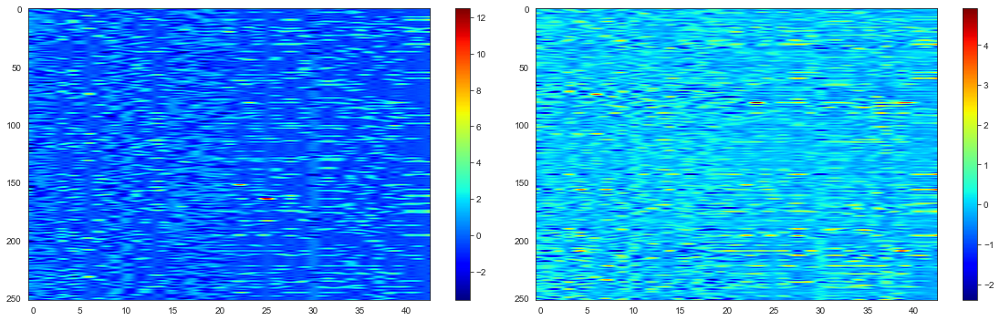

In [1744]:
from numpy.linalg import matrix_power

Ntest = np.dot(matrix_power(Affy_n,2),test_standard_scale)
#fig, (ax1,ax2) = plt.subplots(1,2, figsize=(16, 5))

my_img = [test_standard_scale, Ntest]

fig = plt.figure(figsize=(16, 5))
columns = 2
rows = 1
for i in range(2):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(my_img[i], cmap='jet', aspect='auto', interpolation='sinc')
    plt.colorbar()


plt.tight_layout()
#plt.show()
plt.savefig('database_cleaned_by_PI_affynity.pdf', dpi=300, bbox_inches='tight')

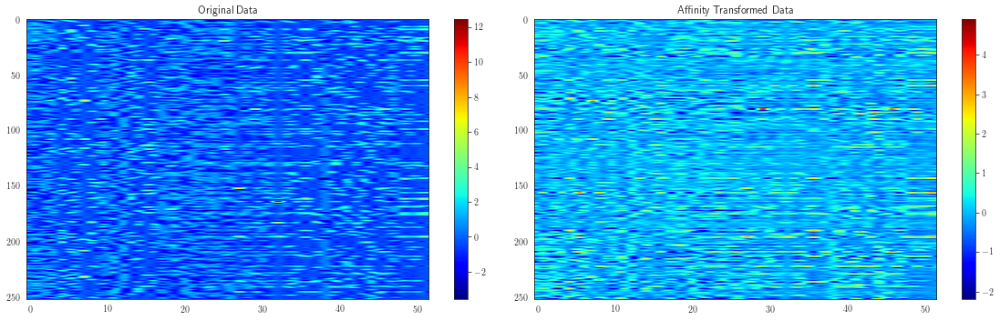

In [497]:
from numpy.linalg import matrix_power

Ntest = np.dot(matrix_power(Affy_n_pi, 2), test)

my_img = [test, Ntest]

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(16, 5))

for i, ax in enumerate(axs.flat):
    im = ax.imshow(my_img[i], cmap='jet', aspect='auto', interpolation='sinc')
    ax.set_title(['Original Data', 'Affinity Transformed Data'][i])
    plt.colorbar(im, ax=ax)

plt.tight_layout()
plt.savefig('database_cleaned_by_PI_affynity_2.pdf', dpi=300, bbox_inches='tight')

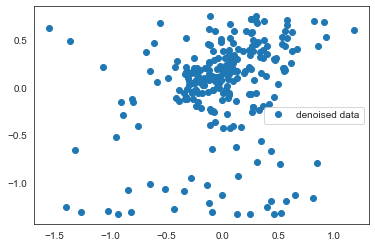

In [1715]:
plt.plot(Ntest[:, 0], Ntest[:, 1], 'o', label = 'denoised data')
#create legend in case you have more than one se
plt.legend()
plt.show()

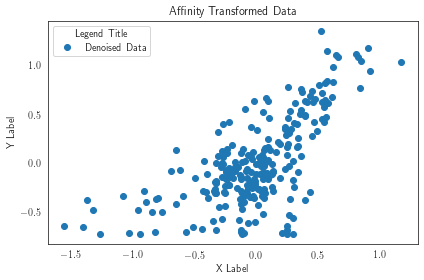

In [409]:
plt.plot(Ntest[:, 0], Ntest[:, 1], 'o', label='Denoised Data')
plt.xlabel('X Label')
plt.ylabel('Y Label')
plt.title('Affinity Transformed Data')
plt.legend(title='Legend Title')
plt.tight_layout()
plt.savefig('Projection_cleaned_by_PI_affynity.pdf', dpi=300, bbox_inches='tight')
plt.show()

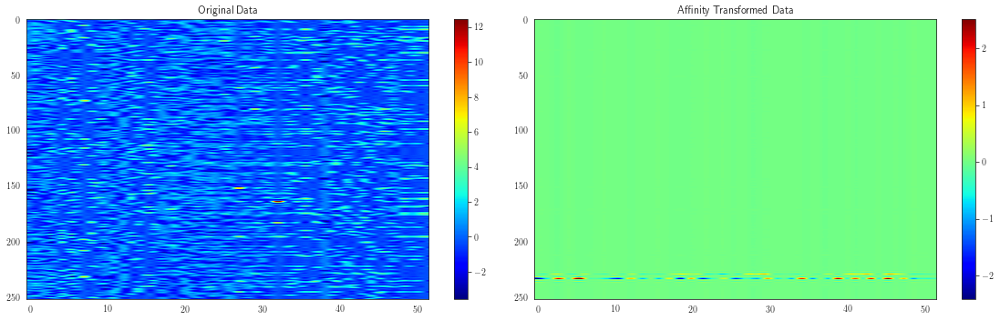

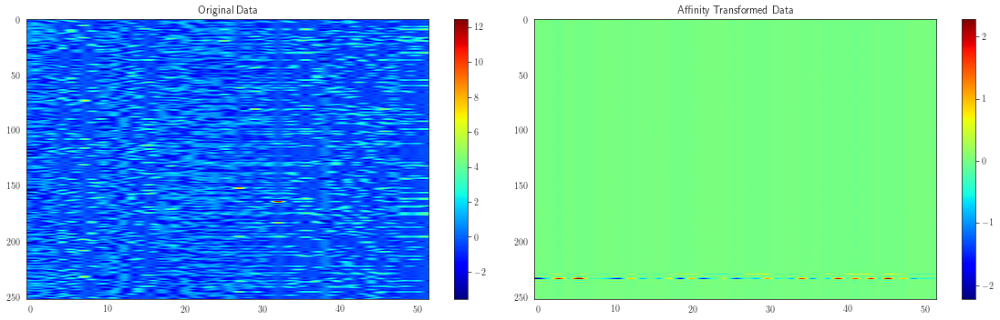

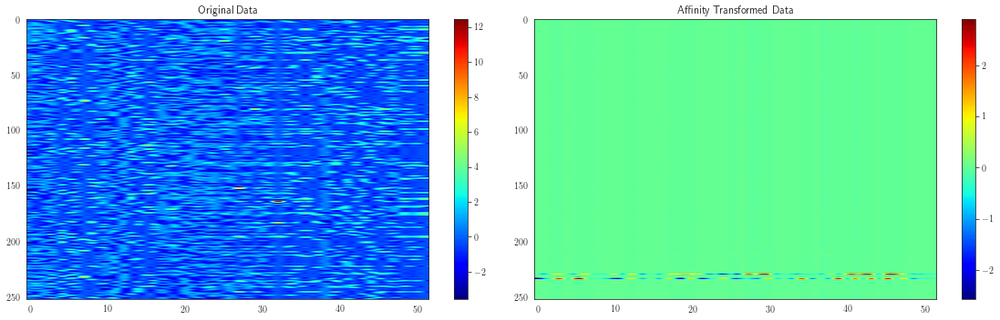

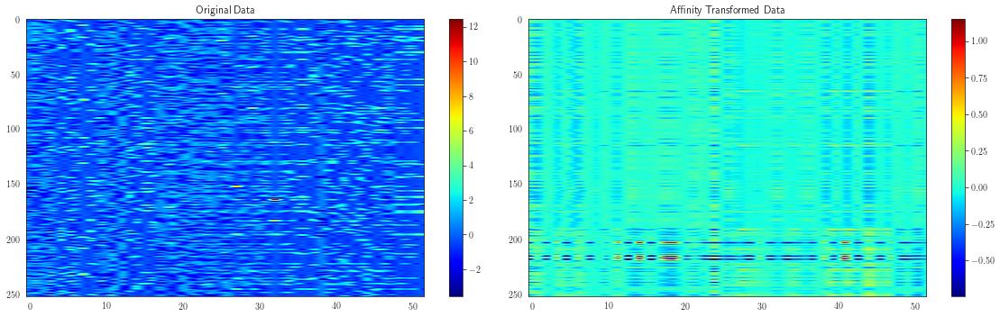

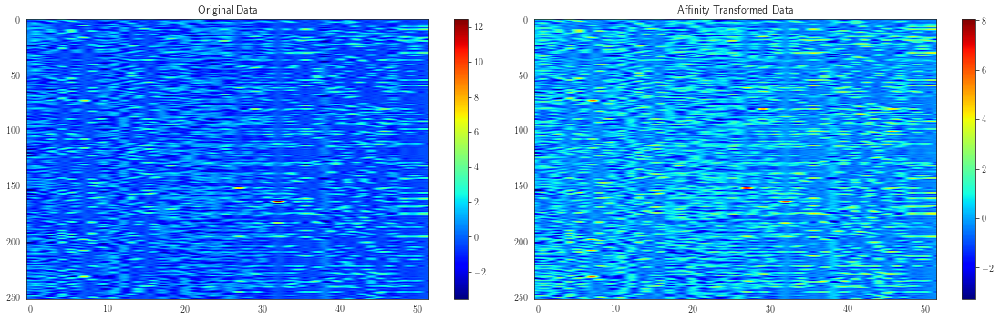

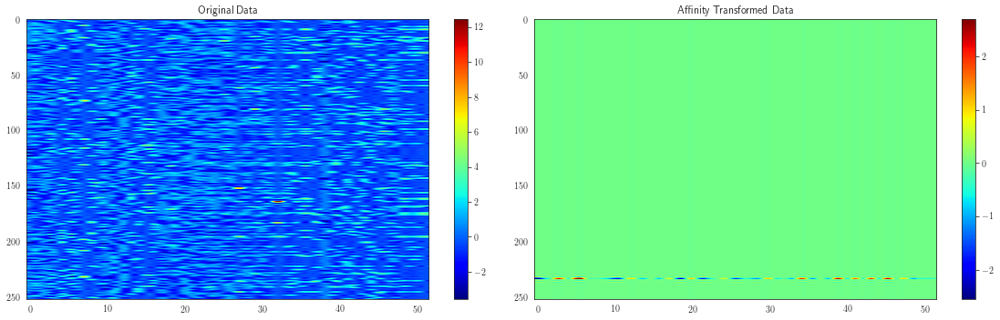

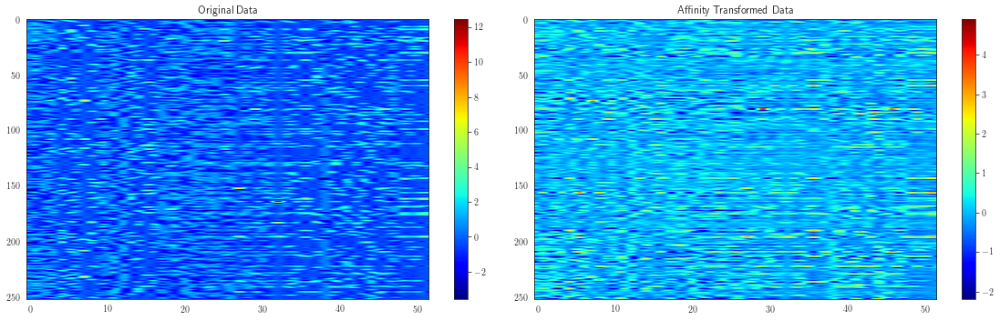

In [511]:
import numpy as np
from sklearn.metrics.pairwise import rbf_kernel
from numpy.linalg import matrix_power
import matplotlib.pyplot as plt

# define a list of 7 X_distance matrices
X_distance_list = [X_distance_B[:, :, 0], 
    X_distance_W[:, :, 0], 
    X_distance_L[:, :, 0],
    X_distance_Bt[:, :, 0],
    X_distance_H[:, :, 0],
    X_distance_S[:, :, 0],
    X_distance_PI[:, :, 0]]

for i, X_distance in enumerate(X_distance_list):
    # apply the RBF kernel and row normalization using the current X_distance matrix
    Affy = rbf_kernel(X_distance)
    Affy_n = Affy / Affy.sum(axis=1)[:, np.newaxis]
    
    # raise the affinity matrix to the power of 2 and multiply with the test data
    Ntest = np.dot(matrix_power(Affy_n, 2), test)
    
    # plot the original and transformed data
    my_img = [test, Ntest]
    fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(16, 5))
    for j, ax in enumerate(axs.flat):
        im = ax.imshow(my_img[j], cmap='jet', aspect='auto', interpolation='sinc')
        ax.set_title(['Original Data', 'Affinity Transformed Data'][j])
        plt.colorbar(im, ax=ax)
    plt.tight_layout()
    plt.savefig(f'database_cleaned_by_affy_batch_{i+1}.pdf', dpi=300, bbox_inches='tight')


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



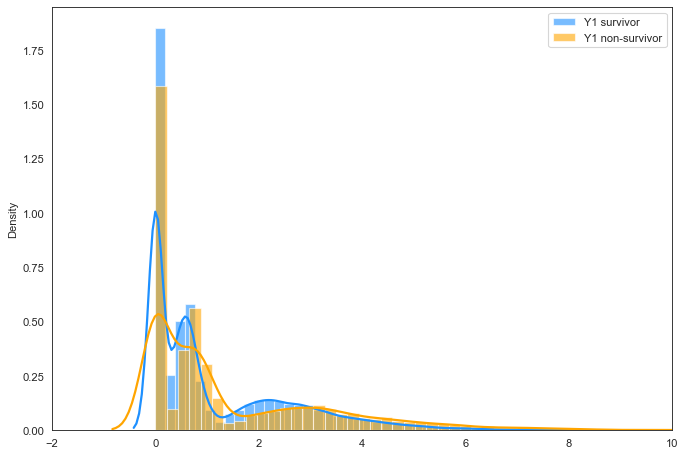

In [1630]:
plt.figure(figsize=(10,7), dpi= 80)
#ax1.hist(X_distance_PI[:189,:189,0], density = True, bins = 50)
#ax2.hist(X_distance_PI[189:,189:,0], density = True, bins = 50)
sns.distplot(X_distance_Bt[:189,:189], color="dodgerblue", label="Y1 survivor", **kwargs)
sns.distplot(X_distance_Bt[189:,189:], color="orange", label="Y1 non-survivor", **kwargs)

plt.xlim(-2,10)
#plt.ylim(0,1.05)
plt.legend();
plt.savefig('Bt_pat_distance_hist_density.pdf', dpi=300, bbox_inches='tight')

In [1456]:
Affy_n.shape

(252, 252)

In [1085]:
import scipy
from scipy.stats import norm
from scipy.stats import rv_histogram

df = X_distance_PI[:,:,0]

#Build training, validation   
timeslot_x_train_end = int(len(df)* 0.7)
timeslot_x_valid_end = int(len(df)* 0.9)

data = df
data_train = data[:timeslot_x_train_end]
data_valid = data[timeslot_x_train_end:timeslot_x_valid_end]

#Make normal distribution objects from data mean and standard deviation
norm_dist_train = norm(data_train.mean(), data_train.std())
norm_dist_valid = norm(data_valid.mean(), data_valid.std())

#Generate arrays of pdf evaluations
X1 = np.linspace(np.min(data_train), np.max(data_train), 1000)
X2 = np.linspace(np.min(data_valid), np.max(data_valid), 1000)
rvs_train = [norm_dist_train.pdf(x) for x in X1]
rvs_valid = [norm_dist_valid.pdf(x) for x in X2]

#Calculate the Kullback–Leibler divergence between the different datasets
entropy_train_valid = scipy.special.rel_entr(rvs_train, rvs_valid)       
kl_div_train_valid = np.sum(entropy_train_valid)

#Print the values of the Kullback–Leibler divergence
print(f"Kullback–Leibler divergence between training and validation dataset: {kl_div_train_valid}")

Kullback–Leibler divergence between training and validation dataset: 1.37000427139997


In [1084]:
data_train.shape

(176, 252, 3)

In [1037]:
help(PairwiseDistance)

Help on class PairwiseDistance in module gtda.diagrams.distance:

class PairwiseDistance(sklearn.base.BaseEstimator, sklearn.base.TransformerMixin)
 |  PairwiseDistance(metric='landscape', metric_params=None, order=2.0, n_jobs=None)
 |  
 |  :ref:`Distances <wasserstein_and_bottleneck_distance>` between pairs
 |  of persistence diagrams.
 |  
 |  Given two collections of persistence diagrams consisting of
 |  birth-death-dimension triples [b, d, q], a collection of distance
 |  matrices or a single distance matrix between pairs of diagrams is
 |  calculated according to the following steps:
 |  
 |      1. All diagrams are partitioned into subdiagrams corresponding to
 |         distinct homology dimensions.
 |      2. Pairwise distances between subdiagrams of equal homology
 |         dimension are calculated according to the parameters `metric` and
 |         `metric_params`. This gives a collection of distance matrices,
 |         :math:`\mathbf{D} = (D_{q_1}, \ldots, D_{q_n})`.
 | 

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
#import scprep

In [1827]:
test_standard_scale

,0,1,2,3,4,5,6,7,8,9,...,33,34,35,36,37,38,39,40,41,42
0,-0.204075,-1.330124,0.459695,-0.394922,-0.367607,1.091469,-0.213643,2.886751,-2.240322,-0.745356,...,1.713914,-0.577350,-0.421391,-0.491304,-0.565130,-0.421391,1.042439,-0.434372,-0.434372,-0.309277
1,0.795388,0.751809,-1.263521,2.532146,-0.367607,-0.916197,-0.213643,-0.346410,0.539351,1.341641,...,-0.583460,-0.577350,-0.421391,-0.491304,-0.565130,-0.421391,-0.528232,-0.434372,-0.434372,-0.309277
2,-0.840097,0.751809,1.536705,-0.394922,2.720294,1.091469,-0.213643,-0.346410,0.155948,-0.745356,...,-0.583460,1.732051,-0.421391,-0.491304,-0.565130,-0.421391,-0.206958,-0.434372,-0.434372,-0.309277
3,0.159366,-1.330124,0.890499,-0.394922,-0.367607,1.091469,-0.213643,-0.346410,-0.706710,-0.745356,...,1.713914,1.732051,2.373095,-0.491304,-0.565130,-0.421391,0.863954,-0.434372,-0.434372,-0.309277
4,0.795388,-1.330124,-0.832717,-0.394922,-0.367607,-0.916197,-0.213643,-0.346410,-0.706710,-0.745356,...,-0.583460,1.732051,-0.421391,-0.491304,-0.565130,-0.421391,-0.599626,-0.434372,-0.434372,-0.309277
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
247,-2.203002,0.751809,-1.478923,2.532146,-0.367607,-0.916197,-0.213643,-0.346410,-0.131605,-0.745356,...,-0.583460,-0.577350,-0.421391,2.035401,-0.565130,-0.421391,-0.671020,-0.434372,-0.434372,-0.309277
248,0.522807,0.751809,1.385924,-0.394922,2.720294,1.091469,-0.213643,-0.346410,1.210307,1.341641,...,-0.583460,-0.577350,-0.421391,-0.491304,1.769505,-0.421391,-0.492534,-0.434372,-0.434372,-0.309277
249,1.340550,-1.330124,-1.694325,2.532146,-0.367607,-0.916197,-0.213643,-0.346410,-0.515008,-0.745356,...,-0.583460,-0.577350,-0.421391,-0.491304,1.769505,-0.421391,-0.706717,-0.434372,-0.434372,-0.309277
250,0.159366,0.751809,1.299763,-0.394922,-0.367607,1.091469,-0.213643,2.886751,0.443500,1.341641,...,-0.583460,-0.577350,-0.421391,-0.491304,-0.565130,2.373095,-0.206958,-0.434372,-0.434372,-0.309277


In [1849]:
data = scprep.reduce.pca(test_standard_scale, n_components=25, method='dense').to_numpy()

In [1850]:
class layer(nn.Module):
    def __init__(self, input_size, output_size, activation=None):
        super(layer, self).__init__()

        self.weight = torch.randn(input_size, output_size).double().requires_grad_()
        self.bias = torch.randn(output_size).double().requires_grad_()
        self.activation = activation

    def forward(self, x):
        output = torch.matmul(x, self.weight) + self.bias
        output = self.activation(output)
        return output

In [1851]:
# move data to pytorch tensors
data_tensor = torch.Tensor(data)

In [1852]:
data_tensor.shape

torch.Size([252, 25])

In [1872]:
# layers will be input -> 100 -> 2 --> 100 -> output
# first hidden layer of size 100
hidden_layer1 = layer(input_size=data_tensor.shape[1], 
                      output_size= 25, 
                      activation=nn.ReLU())

# we won't apply a nonlinear activation to the 2D middle layer
hidden_layer2 = layer(input_size=25, 
                      output_size=2,
                      activation=None)

# last hidden layer of size 100
hidden_layer3 = layer(input_size=2,
                         output_size=25, 
                         activation=nn.ReLU())

# the output should be the same size as the input
output = layer(input_size=25,
              output_size=data_tensor.shape[1], 
               activation=None)

# Method 2
PyTorch provides the linear layers we've been manually defining in its nn module (the same place we've been getting our activation functions) as nn.Linear(), so let's go ahead and repeat the layer creation step above using this new knowledge.

In [1873]:
# layers will be input -> 100 -> 2 --> 100 -> output

# first hidden layer of size 100
hidden_layer1 = nn.Linear(in_features=data_tensor.shape[1], 
                      out_features= 25)

# second middle layer
hidden_layer2 = nn.Linear(in_features=25, 
                      out_features=2)

# last hidden layer of size 100
hidden_layer3 = nn.Linear(in_features=2,
                        out_features=25)

# the output should be the same size as the input
output_layer4 = nn.Linear(in_features=25,
              out_features=data_tensor.shape[1])

In [1874]:
activation_1 = nn.ReLU()
activation_3 = nn.ReLU()

In [1875]:
autoencoder1 = nn.Sequential(hidden_layer1,
                            activation_1,
                            hidden_layer2,
                            hidden_layer3,
                            activation_3,
                            output_layer4
                            )

In [1876]:
print(autoencoder1)

Sequential(
  (0): Linear(in_features=25, out_features=25, bias=True)
  (1): ReLU()
  (2): Linear(in_features=25, out_features=2, bias=True)
  (3): Linear(in_features=2, out_features=25, bias=True)
  (4): ReLU()
  (5): Linear(in_features=25, out_features=25, bias=True)
)


In [1877]:
#optimizer
learning_rate = 0.001

optimizer = optim.SGD(autoencoder1.parameters(),
                       lr=learning_rate)

In [1878]:
#loss function
loss_fcn = nn.MSELoss()

In [1883]:
#train network

def train_model(model, n_epochs=10):

    batch_size=3
    learning_rate = 0.001
    optimizer = optim.SGD(model.parameters(),
                        lr=learning_rate)
    loss_fcn = nn.MSELoss()

    # we'll train the network for 10 epochs
    step = 0
    for epoch in range(n_epochs):
        # randomize the order of the data each time through
        random_order = np.random.permutation(data_tensor.shape[0])
        data_randomized = data_tensor[random_order]

        # train the network on batches of size `batch_size`
        for data_batch in np.array_split(data_randomized, data_randomized.shape[0] // batch_size):
            step += 1

            # update the network weights to minimize the loss
            output = model(data_batch)

            # get loss
            loss = loss_fcn(output, data_batch)

            # print the loss every 100 epochs
            if step % 100 == 0:
                print("Step: {} Loss: {:.3f}".format(step, loss.item()))

            # backpropagate the loss
            loss.backward()

            # update parameters
            optimizer.step()

            # reset gradients
            optimizer.zero_grad()

    return model

In [1884]:
autoencoder1 = train_model(autoencoder1)

Step: 100 Loss: 1.956
Step: 200 Loss: 1.016
Step: 300 Loss: 1.809
Step: 400 Loss: 0.818
Step: 500 Loss: 1.069
Step: 600 Loss: 1.301
Step: 700 Loss: 1.846
Step: 800 Loss: 0.746


In [1885]:
print(autoencoder1[:3])

Sequential(
  (0): Linear(in_features=25, out_features=25, bias=True)
  (1): ReLU()
  (2): Linear(in_features=25, out_features=2, bias=True)
)


<AxesSubplot:xlabel='AE Coordinate 1', ylabel='AE Coordinate 2'>

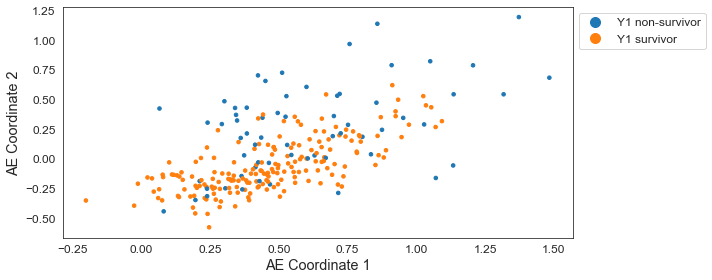

In [1886]:
# let's get the 2D internal hidden layer and visualize it with a scatter plot

with torch.no_grad():
    ae_coordinates = autoencoder1[:3](data_tensor).numpy()


scprep.plot.scatter2d(ae_coordinates, c=ycat,
                      label_prefix='AE Coordinate ', discrete=True,
                      legend_anchor=(1,1), figsize=(10,4))

In [1887]:
autoencoder1 = train_model(autoencoder1, n_epochs=50)

Step: 100 Loss: 1.557
Step: 200 Loss: 1.291
Step: 300 Loss: 1.678
Step: 400 Loss: 1.882
Step: 500 Loss: 0.854
Step: 600 Loss: 0.779
Step: 700 Loss: 1.320
Step: 800 Loss: 2.092
Step: 900 Loss: 1.305
Step: 1000 Loss: 0.923
Step: 1100 Loss: 1.464
Step: 1200 Loss: 1.390
Step: 1300 Loss: 1.073
Step: 1400 Loss: 1.028
Step: 1500 Loss: 2.260
Step: 1600 Loss: 1.814
Step: 1700 Loss: 2.018
Step: 1800 Loss: 1.557
Step: 1900 Loss: 1.779
Step: 2000 Loss: 1.032
Step: 2100 Loss: 1.095
Step: 2200 Loss: 0.952
Step: 2300 Loss: 0.931
Step: 2400 Loss: 1.427
Step: 2500 Loss: 1.297
Step: 2600 Loss: 1.239
Step: 2700 Loss: 1.480
Step: 2800 Loss: 1.063
Step: 2900 Loss: 1.276
Step: 3000 Loss: 2.068
Step: 3100 Loss: 1.791
Step: 3200 Loss: 1.576
Step: 3300 Loss: 1.325
Step: 3400 Loss: 1.193
Step: 3500 Loss: 1.312
Step: 3600 Loss: 1.852
Step: 3700 Loss: 2.035
Step: 3800 Loss: 1.154
Step: 3900 Loss: 1.405
Step: 4000 Loss: 1.343
Step: 4100 Loss: 0.951
Step: 4200 Loss: 0.722


<AxesSubplot:xlabel='AE Coordinate 1', ylabel='AE Coordinate 2'>

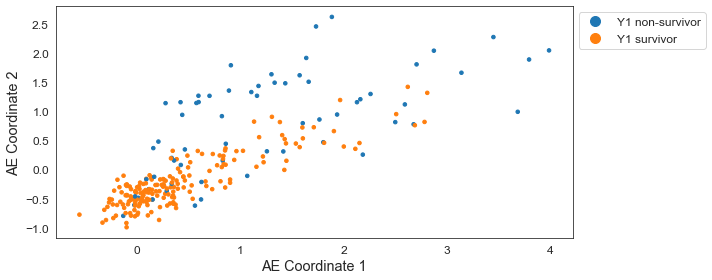

In [1888]:
with torch.no_grad():
    ae_coordinates = autoencoder1[:3](data_tensor).numpy()


scprep.plot.scatter2d(ae_coordinates, c=ycat,
                      label_prefix='AE Coordinate ', discrete=True,
                      legend_anchor=(1,1), figsize=(10,4))

In [1889]:
# ======
# choose from nn.Sigmoid(), nn.Tanh() and others in the documentation
activation_2 = nn.Tanh()
# ======

autoencoder2 = nn.Sequential(hidden_layer1,
                            activation_1,
                            hidden_layer2,
                            activation_2,
                            hidden_layer3,
                            activation_3,
                            output_layer4
                            )

In [1894]:
autoencoder2 = train_model(autoencoder2,n_epochs=50)

Step: 100 Loss: 1.204
Step: 200 Loss: 1.254
Step: 300 Loss: 1.622
Step: 400 Loss: 0.845
Step: 500 Loss: 1.025
Step: 600 Loss: 1.441
Step: 700 Loss: 1.264
Step: 800 Loss: 1.780
Step: 900 Loss: 3.682
Step: 1000 Loss: 1.672
Step: 1100 Loss: 1.333
Step: 1200 Loss: 1.661
Step: 1300 Loss: 1.611
Step: 1400 Loss: 0.677
Step: 1500 Loss: 0.911
Step: 1600 Loss: 1.057
Step: 1700 Loss: 1.628
Step: 1800 Loss: 1.614
Step: 1900 Loss: 0.647
Step: 2000 Loss: 1.027
Step: 2100 Loss: 0.895
Step: 2200 Loss: 1.547
Step: 2300 Loss: 1.295
Step: 2400 Loss: 1.686
Step: 2500 Loss: 0.806
Step: 2600 Loss: 1.415
Step: 2700 Loss: 2.195
Step: 2800 Loss: 1.693
Step: 2900 Loss: 1.123
Step: 3000 Loss: 1.130
Step: 3100 Loss: 0.921
Step: 3200 Loss: 1.374
Step: 3300 Loss: 1.602
Step: 3400 Loss: 2.631
Step: 3500 Loss: 1.080
Step: 3600 Loss: 1.156
Step: 3700 Loss: 1.044
Step: 3800 Loss: 2.617
Step: 3900 Loss: 1.337
Step: 4000 Loss: 1.068
Step: 4100 Loss: 1.344
Step: 4200 Loss: 1.092


<AxesSubplot:xlabel='AE Coordinate 1', ylabel='AE Coordinate 2'>

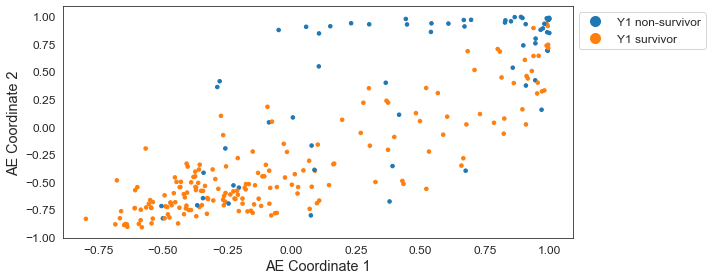

In [1895]:
# let's get the 2D internal hidden layer and visualize it with a scatter plot

with torch.no_grad():
    ae_coordinates2 = autoencoder2[:4](data_tensor).numpy()

scprep.plot.scatter2d(ae_coordinates2, c=ycat,
                      label_prefix='AE Coordinate ', discrete=True,
                      legend_anchor=(1,1), figsize=(10,4))

In [1892]:
# ======
# choose from nn.Sigmoid(), nn.Tanh() and others in the documentation
activation_1 = nn.Tanh()
activation_3 = nn.Tanh()
# ======

autoencoder3 = nn.Sequential(hidden_layer1,
                            activation_1,
                            hidden_layer2,
                            hidden_layer3,
                            activation_3,
                            output_layer4
                            )

<AxesSubplot:xlabel='AE Coordinate 1', ylabel='AE Coordinate 2'>

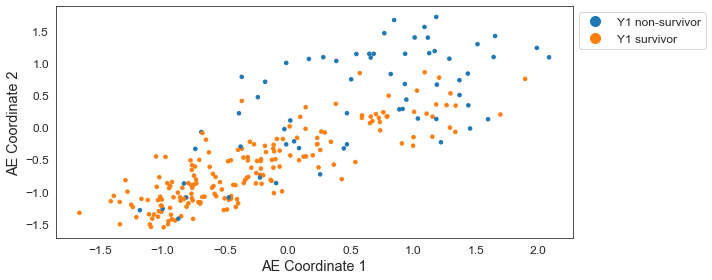

In [1893]:
# let's get the 2D internal hidden layer and visualize it with a scatter plot

with torch.no_grad():
    ae_coordinates3 = autoencoder3[:3](data_tensor).numpy()

scprep.plot.scatter2d(ae_coordinates3, c=ycat,
                      label_prefix='AE Coordinate ', discrete=True,
                      legend_anchor=(1,1), figsize=(10,4))